# IMPORT

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import skew
from statannot import add_stat_annotation
from scipy import stats

In [2]:
from ydata_profiling import ProfileReport

In [3]:
from sklearn.model_selection import train_test_split
#pour les différents Scaler
from sklearn.preprocessing import MaxAbsScaler, QuantileTransformer, PowerTransformer, MinMaxScaler, StandardScaler, RobustScaler
#pour les différents modèles de ML
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.svm import LinearSVC, NuSVC, SVC
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE

from sklearn.neural_network import MLPClassifier


#pour les metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import recall_score, make_scorer


# pour les hyperparalmètres
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Pour les explications de modeles
from sklearn.linear_model import LassoCV
import shap
from sklearn.inspection import permutation_importance

In [4]:
# Pour le DEEP LEARNING
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

2024-02-07 14:09:42.252166: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
link_foie = "https://raw.githubusercontent.com/MaskiVal/DataSets/main/liver_patient.csv"


In [6]:
df_foie = pd.read_csv(link_foie)
df_foie.sample(20)

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
309,48,Female,1.1,0.7,527,178,250,8.0,4.2,1.1,1
365,40,Male,0.7,0.2,176,28,43,5.3,2.4,0.8,2
505,32,Male,32.6,14.1,219,95,235,5.8,3.1,1.1,1
542,62,Male,0.7,0.2,173,46,47,7.3,4.1,1.2,2
413,48,Male,0.7,0.2,208,15,30,4.6,2.1,0.8,2
275,26,Male,1.9,0.8,180,22,19,8.2,4.1,1.0,2
333,36,Female,0.7,0.2,152,21,25,5.9,3.1,1.1,2
217,49,Male,1.1,0.5,159,30,31,7.0,4.3,1.5,1
576,32,Male,15.0,8.2,289,58,80,5.3,2.2,0.7,1
108,36,Male,0.8,0.2,158,29,39,6.0,2.2,0.5,2


# Exploration

In [7]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         583 non-null    int64  
 1   Gender                      583 non-null    object 
 2   Total_Bilirubin             583 non-null    float64
 3   Direct_Bilirubin            583 non-null    float64
 4   Alkaline_Phosphotase        583 non-null    int64  
 5   Alamine_Aminotransferase    583 non-null    int64  
 6   Aspartate_Aminotransferase  583 non-null    int64  
 7   Total_Protiens              583 non-null    float64
 8   Albumin                     583 non-null    float64
 9   Albumin_and_Globulin_Ratio  579 non-null    float64
 10  Dataset                     583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


In [8]:
df_foie[df_foie['Albumin_and_Globulin_Ratio'].isna()==True]

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
209,45,Female,0.9,0.3,189,23,33,6.6,3.9,NaN,1
241,51,Male,0.8,0.2,230,24,46,6.5,3.1,NaN,1
253,35,Female,0.6,0.2,180,12,15,5.2,2.7,NaN,2
312,27,Male,1.3,0.6,106,25,54,8.5,4.8,NaN,2


In [9]:
df_foie.describe()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Dataset
count,583.000000,583.000000,583.000000,583.000000,583.000000,583.000000,583.000000,583.000000,579.000000,583.000000
mean,44.746141,3.298799,1.486106,290.576329,80.713551,109.910806,6.483190,3.141852,0.947064,1.286449
std,16.189833,6.209522,2.808498,242.937989,182.620356,288.918529,1.085451,0.795519,0.319592,0.452490
min,4.000000,0.400000,0.100000,63.000000,10.000000,10.000000,2.700000,0.900000,0.300000,1.000000
25%,33.000000,0.800000,0.200000,175.500000,23.000000,25.000000,5.800000,2.600000,0.700000,1.000000
50%,45.000000,1.000000,0.300000,208.000000,35.000000,42.000000,6.600000,3.100000,0.930000,1.000000
75%,58.000000,2.600000,1.300000,298.000000,60.500000,87.000000,7.200000,3.800000,1.100000,2.000000
max,90.000000,75.000000,19.700000,2110.000000,2000.000000,4929.000000,9.600000,5.500000,2.800000,2.000000


In [10]:
profile = ProfileReport(df_foie, title="Report_maladie_du_foie")

In [11]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Detection des duplicates et drop

In [13]:
doublons = df_foie.duplicated()
print(df_foie[doublons])

     Age  Gender  Total_Bilirubin  Direct_Bilirubin  Alkaline_Phosphotase  \
19    40  Female              0.9               0.3                   293   
26    34    Male              4.1               2.0                   289   
34    38  Female              2.6               1.2                   410   
55    42    Male              8.9               4.5                   272   
62    58    Male              1.0               0.5                   158   
106   36    Male              5.3               2.3                   145   
108   36    Male              0.8               0.2                   158   
138   18    Male              0.8               0.2                   282   
143   30    Male              1.6               0.4                   332   
158   72    Male              0.7               0.1                   196   
164   39    Male              1.9               0.9                   180   
174   31    Male              0.6               0.1                   175   

In [14]:
df_foie.drop_duplicates(inplace=True)

In [15]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Direct_Bilirubin            570 non-null    float64
 4   Alkaline_Phosphotase        570 non-null    int64  
 5   Alamine_Aminotransferase    570 non-null    int64  
 6   Aspartate_Aminotransferase  570 non-null    int64  
 7   Total_Protiens              570 non-null    float64
 8   Albumin                     570 non-null    float64
 9   Albumin_and_Globulin_Ratio  566 non-null    float64
 10  Dataset                     570 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 53.4+ KB


# Remplacement des NaN

In [16]:
skewness_value = df_foie['Albumin_and_Globulin_Ratio'].skew()

In [17]:
print("Skewness:", skewness_value)

Skewness: 1.0012944308926688


In [18]:
df_foie['Albumin_and_Globulin_Ratio'].fillna(df_foie['Albumin_and_Globulin_Ratio'].mean(), inplace = True)

In [19]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Direct_Bilirubin            570 non-null    float64
 4   Alkaline_Phosphotase        570 non-null    int64  
 5   Alamine_Aminotransferase    570 non-null    int64  
 6   Aspartate_Aminotransferase  570 non-null    int64  
 7   Total_Protiens              570 non-null    float64
 8   Albumin                     570 non-null    float64
 9   Albumin_and_Globulin_Ratio  570 non-null    float64
 10  Dataset                     570 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 53.4+ KB


# Creation de la colonne genre factorisée

In [20]:
df_foie['fact_Gender'] = df_foie['Gender'].factorize()[0]

In [21]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Direct_Bilirubin            570 non-null    float64
 4   Alkaline_Phosphotase        570 non-null    int64  
 5   Alamine_Aminotransferase    570 non-null    int64  
 6   Aspartate_Aminotransferase  570 non-null    int64  
 7   Total_Protiens              570 non-null    float64
 8   Albumin                     570 non-null    float64
 9   Albumin_and_Globulin_Ratio  570 non-null    float64
 10  Dataset                     570 non-null    int64  
 11  fact_Gender                 570 non-null    int64  
dtypes: float64(5), int64(6), object(1)
memory usage: 57.9+ KB


In [22]:
df_foie['fact_Gender'].value_counts()

1    430
0    140
Name: fact_Gender, dtype: int64

# Distribution des données & Corrélations

## Distribution

In [23]:
%matplotlib inline
import matplotlib.pyplot as plt

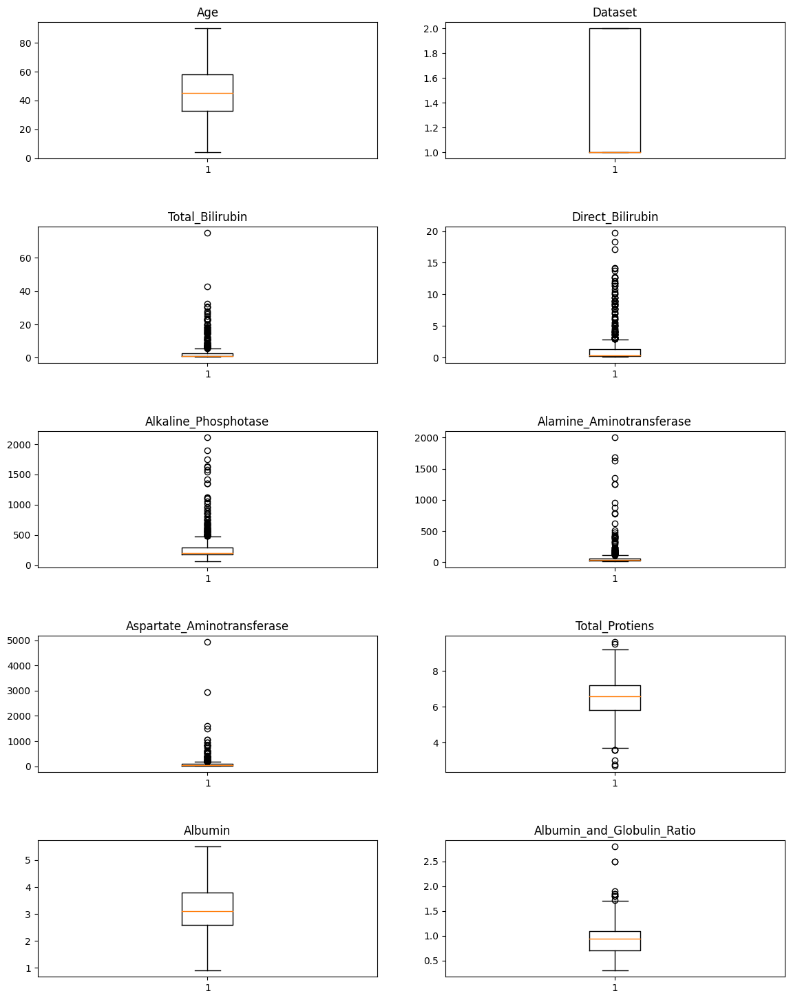

In [24]:
fig, axes = plt.subplots(5, 2, figsize=(14, 18))
plt.subplots_adjust(hspace=0.5)

axes[0, 0].boxplot(df_foie['Age'])
axes[0, 0].set_title('Age')

axes[0, 1].boxplot(df_foie['Dataset'])
axes[0, 1].set_title('Dataset')

axes[1, 0].boxplot(df_foie['Total_Bilirubin'])
axes[1, 0].set_title('Total_Bilirubin')

axes[1, 1].boxplot(df_foie['Direct_Bilirubin'])
axes[1, 1].set_title('Direct_Bilirubin')

axes[2, 0].boxplot(df_foie['Alkaline_Phosphotase'])
axes[2, 0].set_title('Alkaline_Phosphotase')

axes[2, 1].boxplot(df_foie['Alamine_Aminotransferase'])
axes[2, 1].set_title('Alamine_Aminotransferase')

axes[3, 0].boxplot(df_foie['Aspartate_Aminotransferase'])
axes[3, 0].set_title('Aspartate_Aminotransferase')

axes[3, 1].boxplot(df_foie['Total_Protiens'])
axes[3, 1].set_title('Total_Protiens')

axes[4, 0].boxplot(df_foie['Albumin'])
axes[4, 0].set_title('Albumin')

axes[4, 1].boxplot(df_foie['Albumin_and_Globulin_Ratio'])
axes[4, 1].set_title('Albumin_and_Globulin_Ratio')



plt.show()

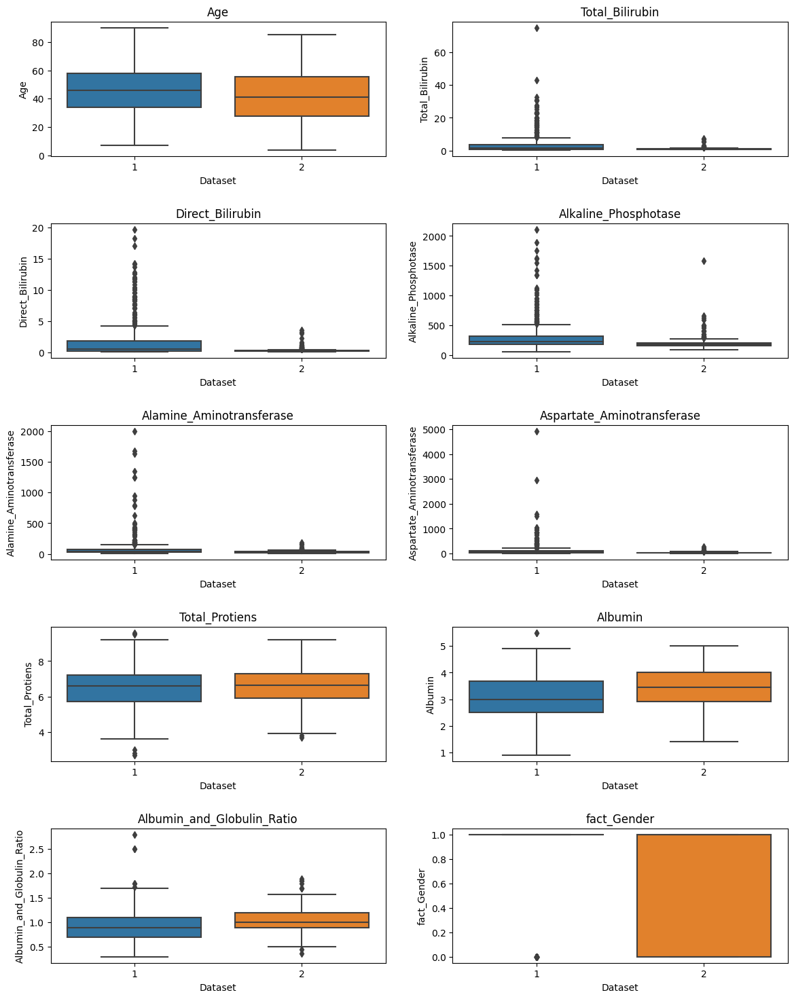

In [25]:
fig, axes = plt.subplots(5, 2, figsize=(14, 18))
plt.subplots_adjust(hspace=0.5)

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Age'], ax=axes[0, 0])
axes[0, 0].set_title('Age')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Total_Bilirubin'], ax=axes[0, 1])
axes[0, 1].set_title('Total_Bilirubin')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Direct_Bilirubin'], ax=axes[1, 0])
axes[1, 0].set_title('Direct_Bilirubin')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Alkaline_Phosphotase'], ax=axes[1, 1])
axes[1, 1].set_title('Alkaline_Phosphotase')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Alamine_Aminotransferase'], ax=axes[2, 0])
axes[2, 0].set_title('Alamine_Aminotransferase')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Aspartate_Aminotransferase'], ax=axes[2, 1])
axes[2, 1].set_title('Aspartate_Aminotransferase')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Total_Protiens'], ax=axes[3, 0])
axes[3, 0].set_title('Total_Protiens')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Albumin'], ax=axes[3, 1])
axes[3, 1].set_title('Albumin')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['Albumin_and_Globulin_Ratio'], ax=axes[4, 0])
axes[4, 0].set_title('Albumin_and_Globulin_Ratio')

sns.boxplot(x=df_foie['Dataset'], y=df_foie['fact_Gender'], ax=axes[4, 1])
axes[4, 1].set_title('fact_Gender')


plt.show()

## Corrélation

### Analyse générale

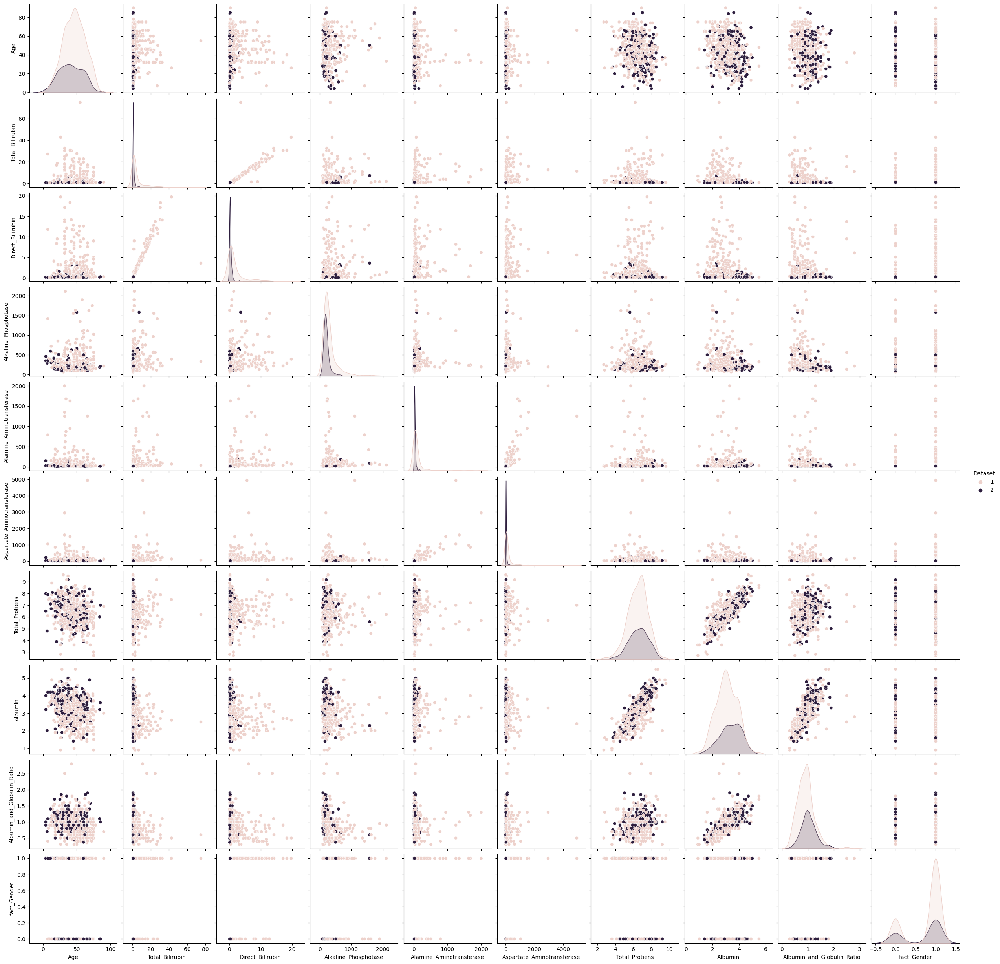

In [26]:
sns.pairplot(df_foie, hue = 'Dataset')
plt.show()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


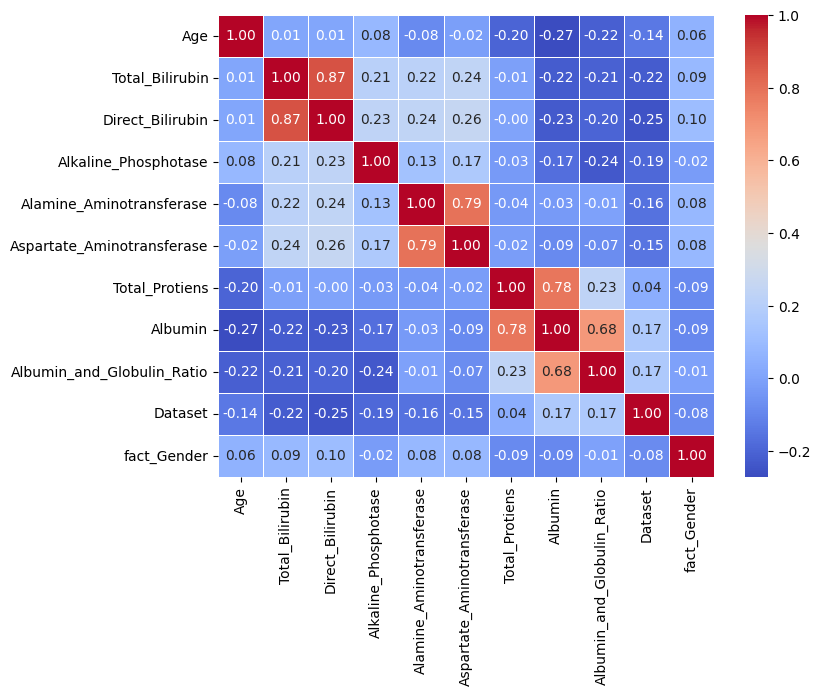

In [27]:
plt.figure(figsize=(8, 6))
sns.heatmap(df_foie.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)

plt.show()

### Drop les colonnes trop corrélées : Direct_Bilirubin, Aspartate_Aminotransferase, Total_Protiens et Albumin


In [28]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Direct_Bilirubin            570 non-null    float64
 4   Alkaline_Phosphotase        570 non-null    int64  
 5   Alamine_Aminotransferase    570 non-null    int64  
 6   Aspartate_Aminotransferase  570 non-null    int64  
 7   Total_Protiens              570 non-null    float64
 8   Albumin                     570 non-null    float64
 9   Albumin_and_Globulin_Ratio  570 non-null    float64
 10  Dataset                     570 non-null    int64  
 11  fact_Gender                 570 non-null    int64  
dtypes: float64(5), int64(6), object(1)
memory usage: 57.9+ KB


In [29]:
df_foie.drop(columns = ['Direct_Bilirubin', 'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin'], inplace = True)

In [30]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Alkaline_Phosphotase        570 non-null    int64  
 4   Alamine_Aminotransferase    570 non-null    int64  
 5   Albumin_and_Globulin_Ratio  570 non-null    float64
 6   Dataset                     570 non-null    int64  
 7   fact_Gender                 570 non-null    int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 40.1+ KB


The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


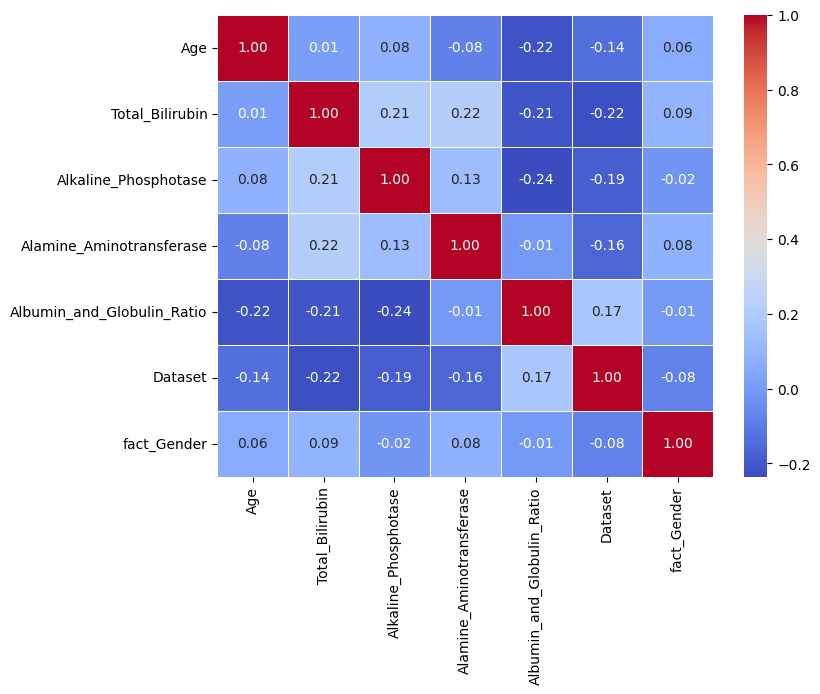

In [31]:
plt.figure(figsize=(8, 6))
sns.heatmap(df_foie.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)

plt.show()

# Statistiques

In [32]:
df_foie['Dataset_str'] = df_foie['Dataset'].astype(str)

In [33]:
df_foie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Alkaline_Phosphotase        570 non-null    int64  
 4   Alamine_Aminotransferase    570 non-null    int64  
 5   Albumin_and_Globulin_Ratio  570 non-null    float64
 6   Dataset                     570 non-null    int64  
 7   fact_Gender                 570 non-null    int64  
 8   Dataset_str                 570 non-null    object 
dtypes: float64(2), int64(5), object(2)
memory usage: 44.5+ KB


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

1 v.s. 2: Kruskal-Wallis paired samples with Bonferroni correction, P_val=2.013e-03 stat=9.538e+00
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

1 v.s. 2: Kruskal-Wallis paired samples with Bonferroni correction, P_val=4.671e-14 stat=5.686e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

1 v.s. 2: Kruskal-Wallis paired samples with Bonferroni correction, P_val=6.222e-11 stat=4.275e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

1 v.s. 2: Kruskal-Wallis paired samples with Bo

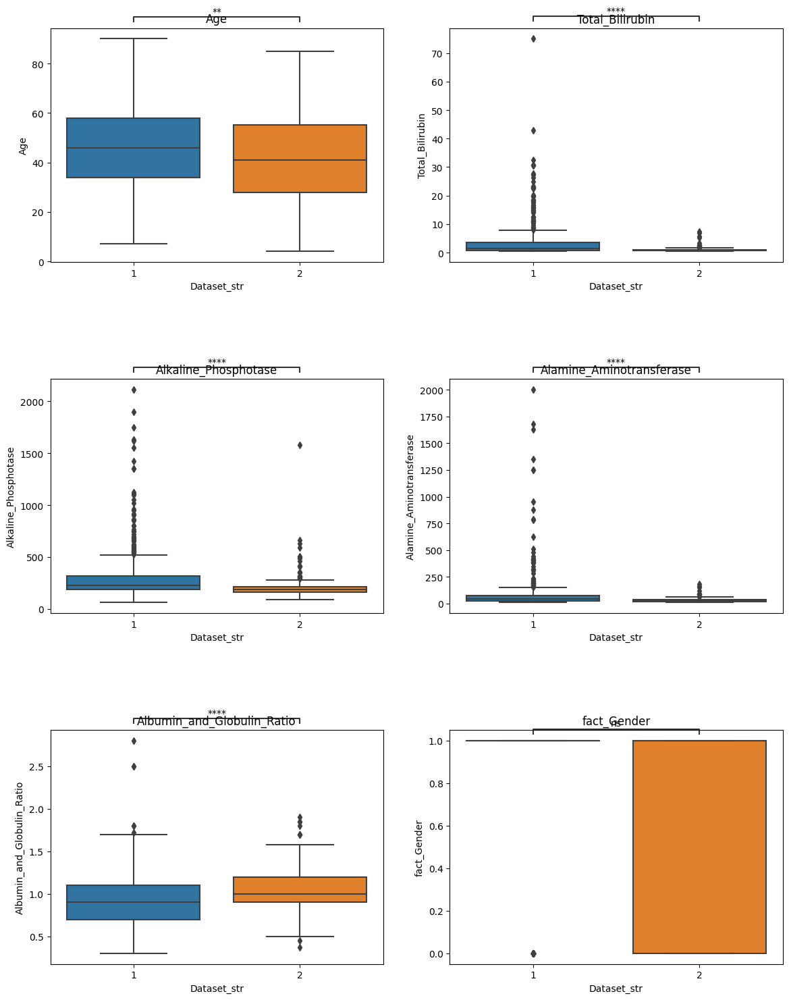

In [34]:
fig, axes = plt.subplots(3, 2, figsize=(14, 18))
plt.subplots_adjust(hspace=0.5)

def add_stat_annotations(x, y, ax):
    add_stat_annotation(data=df_foie, x=x, y=y, ax=ax, box_pairs=[('1', '2')],
                     perform_stat_test=True, test='Kruskal', text_format='star', loc='outside', verbose=2)



sns.boxplot(x=df_foie['Dataset_str'], y=df_foie['Age'], ax=axes[0, 0])
axes[0, 0].set_title('Age')
add_stat_annotations('Dataset_str', 'Age', axes[0, 0])


sns.boxplot(x=df_foie['Dataset_str'], y=df_foie['Total_Bilirubin'], ax=axes[0, 1])
axes[0, 1].set_title('Total_Bilirubin')
add_stat_annotations('Dataset_str', 'Total_Bilirubin', axes[0, 1])

sns.boxplot(x=df_foie['Dataset_str'], y=df_foie['Alkaline_Phosphotase'], ax=axes[1, 0])
axes[1, 0].set_title('Alkaline_Phosphotase')
add_stat_annotations('Dataset_str', 'Alkaline_Phosphotase', axes[1, 0])

sns.boxplot(x=df_foie['Dataset_str'], y=df_foie['Alamine_Aminotransferase'], ax=axes[1, 1])
axes[1, 1].set_title('Alamine_Aminotransferase')
add_stat_annotations('Dataset_str', 'Alamine_Aminotransferase', axes[1, 1])

sns.boxplot(x=df_foie['Dataset_str'], y=df_foie['Albumin_and_Globulin_Ratio'], ax=axes[2, 0])
axes[2, 0].set_title('Albumin_and_Globulin_Ratio')
add_stat_annotations('Dataset_str', 'Albumin_and_Globulin_Ratio', axes[2, 0])

sns.boxplot(x=df_foie['Dataset_str'], y=df_foie['fact_Gender'], ax=axes[2, 1])
axes[2, 1].set_title('fact_Gender')
add_stat_annotations('Dataset_str', 'fact_Gender', axes[2, 1])


plt.show()

In [35]:
df_foie['Dataset'].value_counts()

1    406
2    164
Name: Dataset, dtype: int64

# Création d'un nouveau df avec cible rééquilibrée

In [36]:


X = df_foie.drop(['Dataset', 'Dataset_str', 'Gender'], axis=1)
y = df_foie['Dataset']

# Diviser le jeu de données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Méthode 1 : RandomOverSampler
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)
model_ros = RandomForestClassifier(random_state=42)
model_ros.fit(X_train_ros, y_train_ros)
y_pred_ros = model_ros.predict(X_test)
print("Classification Report RandomOverSampler:\n", classification_report(y_test, y_pred_ros))

# Méthode 2 : SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
model_smote = RandomForestClassifier(random_state=42)
model_smote.fit(X_train_smote, y_train_smote)
y_pred_smote = model_smote.predict(X_test)
print("Classification Report SMOTE:\n", classification_report(y_test, y_pred_smote))

Classification Report RandomOverSampler:
               precision    recall  f1-score   support

           1       0.78      0.80      0.79        81
           2       0.48      0.45      0.47        33

    accuracy                           0.70       114
   macro avg       0.63      0.63      0.63       114
weighted avg       0.70      0.70      0.70       114

Classification Report SMOTE:
               precision    recall  f1-score   support

           1       0.78      0.75      0.77        81
           2       0.44      0.48      0.46        33

    accuracy                           0.68       114
   macro avg       0.61      0.62      0.62       114
weighted avg       0.68      0.68      0.68       114



In [37]:
# Méthode RandomOverSampler

X = df_foie.drop(['Dataset','Dataset_str'], axis=1)
y = df_foie['Dataset']

# Diviser le jeu de données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Initialiser le sur-échantillonneur
ros = RandomOverSampler(random_state=42)

# Appliquer le sur-échantillonnage
X_resampled, y_resampled = ros.fit_resample(X, y)

# Nouveau DataFrame avec les données sur-échantillonnées
df_foie_reajuste = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.Series(y_resampled, name='Dataset')], axis=1)


In [38]:
df_foie_reajuste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812 entries, 0 to 811
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         812 non-null    int64  
 1   Gender                      812 non-null    object 
 2   Total_Bilirubin             812 non-null    float64
 3   Alkaline_Phosphotase        812 non-null    int64  
 4   Alamine_Aminotransferase    812 non-null    int64  
 5   Albumin_and_Globulin_Ratio  812 non-null    float64
 6   fact_Gender                 812 non-null    int64  
 7   Dataset                     812 non-null    int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 50.9+ KB


The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


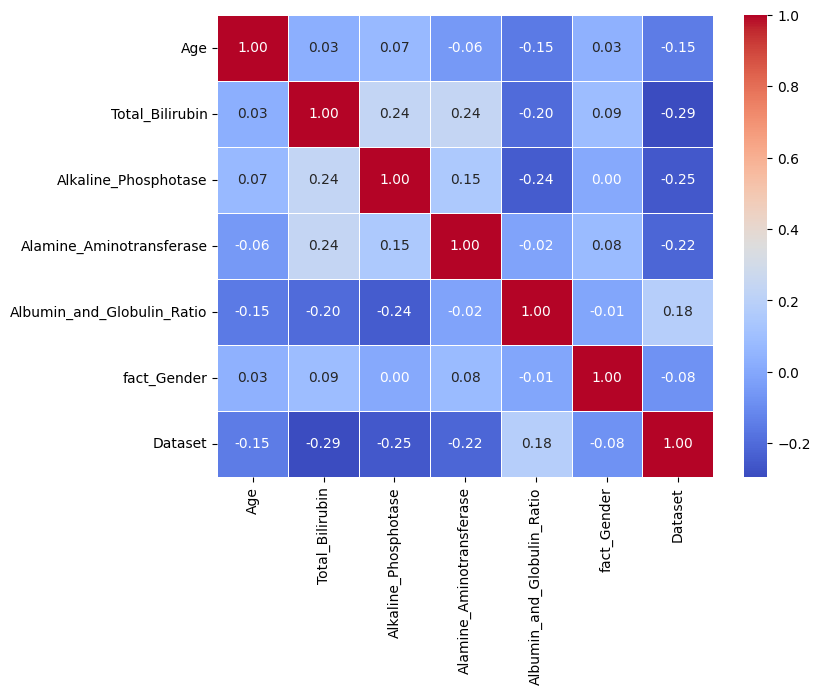

In [39]:
plt.figure(figsize=(8, 6))
sns.heatmap(df_foie_reajuste.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)

plt.show()

In [40]:
df_foie_reajuste['Dataset']  = df_foie_reajuste['Dataset'] .replace({ 2: 0})
df_foie_reajuste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812 entries, 0 to 811
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         812 non-null    int64  
 1   Gender                      812 non-null    object 
 2   Total_Bilirubin             812 non-null    float64
 3   Alkaline_Phosphotase        812 non-null    int64  
 4   Alamine_Aminotransferase    812 non-null    int64  
 5   Albumin_and_Globulin_Ratio  812 non-null    float64
 6   fact_Gender                 812 non-null    int64  
 7   Dataset                     812 non-null    int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 50.9+ KB


In [41]:
df_foie_reajuste['Dataset'].value_counts()

1    406
0    406
Name: Dataset, dtype: int64

In [42]:
df_foie_reajuste.to_csv('dataset_foie_ML.csv', index = False)

# ML sur dataset rééquilibrée

## Pycaret

In [43]:
pip install pycaret

Note: you may need to restart the kernel to use updated packages.


In [44]:
from pycaret.classification import *

In [45]:
clf1 = setup(data=df_foie_reajuste, target='Dataset', session_id = 123)

,Description,Value
0,Session id,123
1,Target,Dataset
2,Target type,Binary
3,Original data shape,"(812, 8)"
4,Transformed data shape,"(812, 8)"
5,Transformed train set shape,"(568, 8)"
6,Transformed test set shape,"(244, 8)"
7,Ordinal features,1
8,Numeric features,6
9,Categorical features,1


In [46]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.8258,0.9261,0.7887,0.8572,0.8186,0.6513,0.6570,0.1140
xgboost,Extreme Gradient Boosting,0.8099,0.8915,0.7466,0.8652,0.7982,0.6195,0.6295,0.0540
rf,Random Forest Classifier,0.8047,0.9097,0.7358,0.8608,0.7899,0.6091,0.6193,0.1520
lightgbm,Light Gradient Boosting Machine,0.8029,0.8713,0.7463,0.8533,0.7914,0.6054,0.6161,0.1380
dt,Decision Tree Classifier,0.7676,0.7671,0.7000,0.8172,0.7495,0.5348,0.5452,0.0280
gbc,Gradient Boosting Classifier,0.7536,0.8206,0.6622,0.8115,0.7271,0.5072,0.5175,0.0960
ada,Ada Boost Classifier,0.6991,0.7720,0.6020,0.7510,0.6647,0.3978,0.4084,0.0850
nb,Naive Bayes,0.6886,0.7319,0.4021,0.9458,0.5584,0.3774,0.4614,0.0320
knn,K Neighbors Classifier,0.6832,0.7303,0.5916,0.7290,0.6504,0.3665,0.3757,0.0420
lr,Logistic Regression,0.6728,0.7460,0.5142,0.7574,0.6081,0.3450,0.3665,1.0950


## Choix des variables

In [47]:
X = df_foie_reajuste[['Age','Total_Bilirubin','Alkaline_Phosphotase', 'Alamine_Aminotransferase','Albumin_and_Globulin_Ratio']]
y = df_foie_reajuste['Dataset']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.75)

In [48]:
print("The length of the initial dataset is :", len(X))
print("The length of the train dataset is   :", len(X_train))
print("The length of the test dataset is    :", len(X_test))

The length of the initial dataset is : 812
The length of the train dataset is   : 609
The length of the test dataset is    : 203


## Boucle avec scaler et ML de classification

In [49]:
list_scalers = [MaxAbsScaler(), QuantileTransformer(), PowerTransformer(),
               MinMaxScaler(), StandardScaler(), RobustScaler()]

In [50]:
##liste des modèles utilisés
list_models = [
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    LogisticRegression(),
    ExtraTreesClassifier(),
    RandomForestClassifier(),
    GradientBoostingClassifier(),
    AdaBoostClassifier(),
    XGBClassifier(),
    LGBMClassifier(verbose=-1),
    LinearSVC(),
    NuSVC(),
    SVC(),
    GaussianNB()
]

In [51]:
#double boucle
results = []
for model in list_models:

    for scaler in list_scalers:

        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model.fit(X_train_scaled, y_train)

        accuracy_train = model.score(X_train_scaled, y_train)
        accuracy_test = model.score(X_test_scaled, y_test)

        y_pred_test = model.predict(X_test_scaled)

        recall_test = recall_score(y_test, y_pred_test)
        overfitting = (model.score(X_train_scaled, y_train) - model.score(X_test_scaled, y_test))

        scores = cross_val_score(model, X_train_scaled, y_train, scoring='recall', cv=5)
        avg_scores = scores.mean()

        confusion_mat = confusion_matrix(y_test, y_pred_test)
        matrice = pd.DataFrame(data = confusion_mat,
                 index = model.classes_ ,
                 columns = model.classes_)
        
        results.append((model.__class__.__name__, scaler.__class__.__name__, accuracy_train, accuracy_test, recall_test, overfitting, avg_scores, matrice))

#tris de la liste results en fonction de la moyenne des scores de croos_validation, puis du recall_test, puis de l'accuracy test
sorted_results = sorted(results, key=lambda x: (x[6], x[4], x[3]), reverse=True)

for model, scaler, accuracy_train, accuracy_test, recall_test, overfitting, avg_scores, matrice in sorted_results:
    print("___________________________")
    print(f"Model: {model}")
    print(f"Scaler: {scaler}")
    print(f"Avg scores - cross validation : {avg_scores}")
    print(f"Accuracy Train: {accuracy_train}")
    print(f"Accuracy Test: {accuracy_test}")
    print(f"Recall Test: {recall_test}")
    print(f"Overfitting: {overfitting}")
    print(matrice)


___________________________
Model: ExtraTreesClassifier
Scaler: QuantileTransformer
Avg scores - cross validation : 0.7895033282130056
Accuracy Train: 1.0
Accuracy Test: 0.896551724137931
Recall Test: 0.8602150537634409
Overfitting: 0.10344827586206895
     0   1
0  102   8
1   13  80
___________________________
Model: ExtraTreesClassifier
Scaler: MinMaxScaler
Avg scores - cross validation : 0.7830005120327701
Accuracy Train: 1.0
Accuracy Test: 0.8817733990147784
Recall Test: 0.8279569892473119
Overfitting: 0.11822660098522164
     0   1
0  102   8
1   16  77
___________________________
Model: ExtraTreesClassifier
Scaler: PowerTransformer
Avg scores - cross validation : 0.7767025089605735
Accuracy Train: 1.0
Accuracy Test: 0.8719211822660099
Recall Test: 0.8602150537634409
Overfitting: 0.1280788177339901
    0   1
0  97  13
1  13  80
___________________________
Model: ExtraTreesClassifier
Scaler: StandardScaler
Avg scores - cross validation : 0.7703020993343574
Accuracy Train: 1.0
Accu

## Cross Validation sur le ExtraTreeClassifier

In [52]:
model = ExtraTreesClassifier()
scaler = QuantileTransformer()
X_train_scaled = scaler.fit_transform(X_train)
model.fit(X_train_scaled, y_train)
X_test_scaled = scaler.transform(X_test)


In [53]:
metrics = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='recall')

metrics

array([0.77777778, 0.77777778, 0.71428571, 0.83870968, 0.72580645])

In [54]:
metrics.mean()

0.7668714797747056

In [55]:
metrics.std()

0.04438517901977671

## RandomSearchCV sur le ExtraTreeClassifier

In [56]:
dico = {'max_depth' : range(1,51), 'min_samples_leaf' : range(1,16), 'min_samples_split' : [2,5,7,10,15,30]}
rando = RandomizedSearchCV(ExtraTreesClassifier(), dico , cv=5, n_iter = 100)
rando.fit(X_train_scaled,y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=ExtraTreesClassifier(bootstrap=False,
                                                  ccp_alpha=0.0,
                                                  class_weight=None,
                                                  criterion='gini',
                                                  max_depth=None,
                                                  max_features='sqrt',
                                                  max_leaf_nodes=None,
                                                  max_samples=None,
                                                  min_impurity_decrease=0.0,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100, n_jobs=None,
                                                  oob_score=False,
                                                  random_state=None, verbose=0,
                                                  warm_start=False),
                   n_iter=100, n_jobs=None,
                   param_distributions={'max_depth': range(1, 51),
                                        'min_samples_leaf': range(1, 16),
                                        'min_samples_split': [2, 5, 7, 10, 15,
                                                              30]},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_score=False, scoring=None, verbose=0)

In [57]:
#meilleures valeurs des hyperparamètres
print(f"Best accuracy score: {rando.best_score_:.5f}")
print(f"Best parameters: {rando.best_params_}")
print(f"Best estimator: {rando.best_estimator_}")

Best accuracy score: 0.78328
Best parameters: {'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 35}
Best estimator: ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=35, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=None, oob_score=False,
                     random_state=None, verbose=0, warm_start=False)


## Modele ExtraTreeClassifier avec best parametres

In [58]:
#Random Search
best_model_ETC = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=35, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=None, oob_score=False,
                     random_state=None, verbose=0, warm_start=False)
X_train_scaled_ETC = scaler.fit_transform(X_train)
best_model_ETC.fit(X_train_scaled_ETC, y_train)
X_test_scaled_ETC = scaler.transform(X_test)

y_pred_ETC = best_model_ETC.predict(X_test_scaled_ETC)
accuracy_ETC = accuracy_score(y_test, y_pred_ETC)
recall_ETC = recall_score(y_test, y_pred_ETC)
confusion_mat_ETC = confusion_matrix(y_test, y_pred_ETC)
scores = cross_val_score(best_model_ETC, X_train_scaled_ETC, y_train, scoring='recall', cv=5)
avg_scores_ETC = scores.mean()
print("Metrics for RandomSearch Model:")
print(f"Avg scores - cross validation : {avg_scores_ETC:.4f}")
print(f"Accuracy: {accuracy_ETC:.4f}")
print(f"Recall: {recall_ETC:.4f}")

Metrics for RandomSearch Model:
Avg scores - cross validation : 0.7669
Accuracy: 0.8424
Recall: 0.7957


## Test predict

In [92]:
for n in [0.4,6.2,3.04,0.31,0.53,5.23,2.83,0.64]:
    print(np.expm1(n))

0.49182469764127035
491.7490410932563
19.905243235092758
0.3634251141321778
0.6989323086185507
185.79280352016818
15.945460824541017
0.8964808793049514


In [93]:
non_malade_1 = [60, 0.49 , 492, 19.9, 0.36]
non_malade_2 = [65, 0.7, 186, 15.95, 0.9]



In [94]:

my_data = np.array([non_malade_1, non_malade_2]).reshape(2,5)
df_data = pd.DataFrame(my_data, columns = [['Age','Total_Bilirubin','Alkaline_Phosphotase', 'Alamine_Aminotransferase','Albumin_and_Globulin_Ratio']])
df_data

,Age,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Albumin_and_Globulin_Ratio
0,60.0,0.49,492.0,19.90,0.36
1,65.0,0.70,186.0,15.95,0.90


In [95]:
best_model_ETC = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=35, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=None, oob_score=False,
                     random_state=None, verbose=0, warm_start=False)
X_train_scaled_ETC = scaler.fit_transform(X_train)
best_model_ETC.fit(X_train_scaled_ETC, y_train)
X_test_scaled_ETC = scaler.transform(df_data)

y_pred_ETC = best_model_ETC.predict(X_test_scaled_ETC)
y_pred_ETC

array([0, 1])

In [96]:
proba = best_model_ETC.predict_proba(X_test_scaled_ETC)
proba

array([[0.95, 0.05],
       [0.09, 0.91]])

In [101]:
proba[0,0]

0.95

In [102]:
proba[1,1]

0.91

## Feature_importance

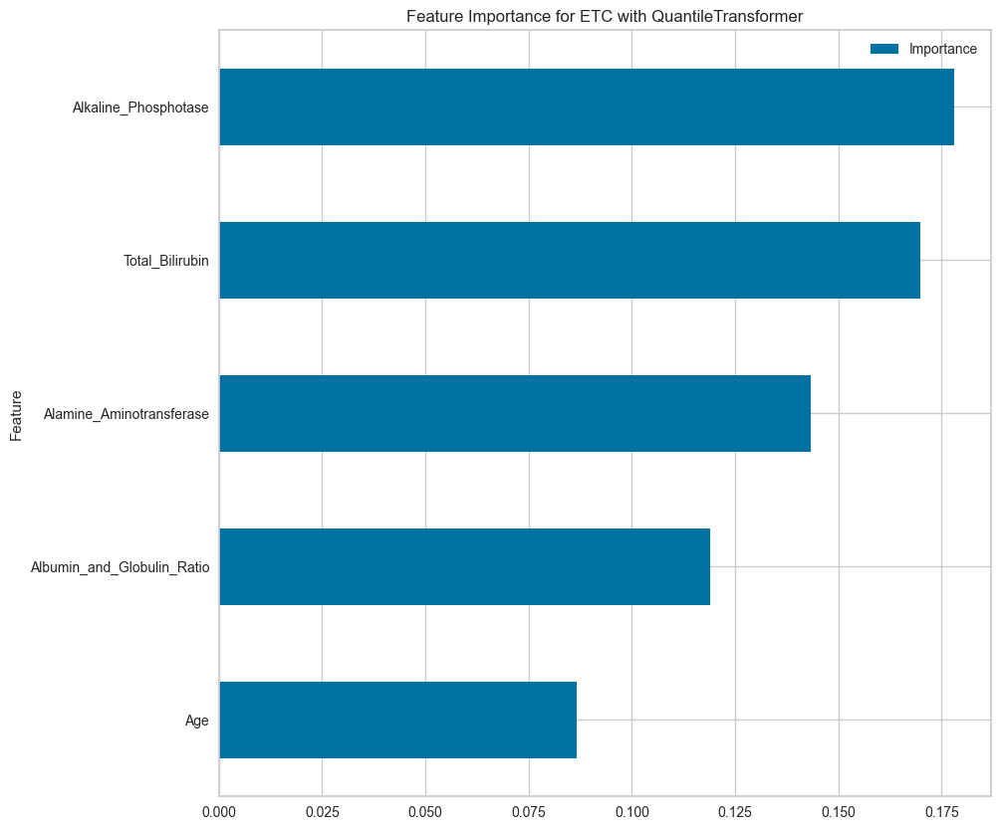

In [62]:
result = permutation_importance(best_model_ETC, X_train_scaled_ETC, y_train, n_repeats=10, random_state=42)

feature_importance_ETC = pd.DataFrame({'Feature': X.columns, 'Importance': result.importances_mean})
feature_importance_ETC = feature_importance_ETC.sort_values('Importance', ascending=True)

feature_importance_ETC.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 10))
plt.title('Feature Importance for ETC with QuantileTransformer')
plt.show()

## LASSO CV

In [63]:
reg = LassoCV()
reg.fit(X_train_scaled_ETC, y_train)

LassoCV(alphas=None, copy_X=True, cv=None, eps=0.001, fit_intercept=True,
        max_iter=1000, n_alphas=100, n_jobs=None, positive=False,
        precompute='auto', random_state=None, selection='cyclic', tol=0.0001,
        verbose=False)

In [64]:
#print("Best alpha using built-in LassoCV: %f" % reg.alphas_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_scaled_ETC,y_train))
coef = pd.Series(reg.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Best score using built-in LassoCV: 0.225823
Lasso picked 5 variables and eliminated the other 0 variables


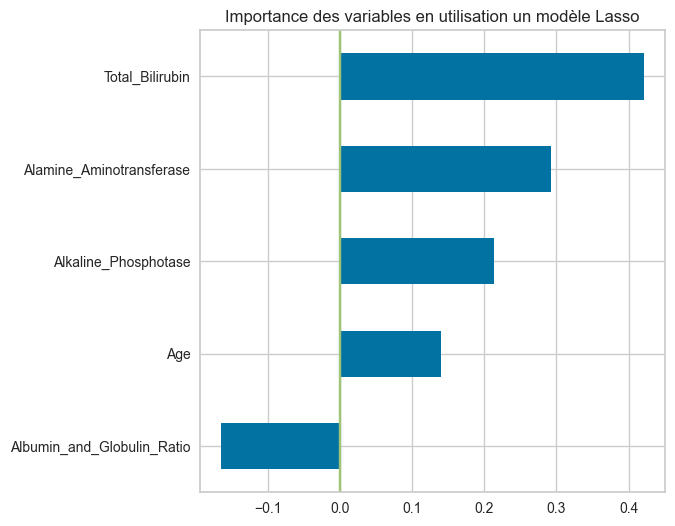

In [65]:
fig = plt.figure(figsize=(6,6))
imp_coef = coef.sort_values()
plt.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.axvline(x=0, color='g')
plt.title("Importance des variables en utilisation un modèle Lasso")
fig.savefig('importance_graph.png', dpi=200, bbox_inches = 'tight') ;

## SHAP

In [66]:
# Convertir le résultat en DataFrame avec les noms de colonnes
X_test_shape = pd.DataFrame(X_test_scaled_ETC, columns=list(X_test.columns))
X_train_shape = pd.DataFrame(X_train_scaled_ETC, columns=list(X_train.columns))

In [67]:
explainer = shap.KernelExplainer(best_model_ETC.predict,shap.sample(X_test_shape,100))

In [68]:
shap_values = explainer.shap_values(X_test_shape,nsamples=100)

  0%|          | 0/5 [00:00<?, ?it/s]

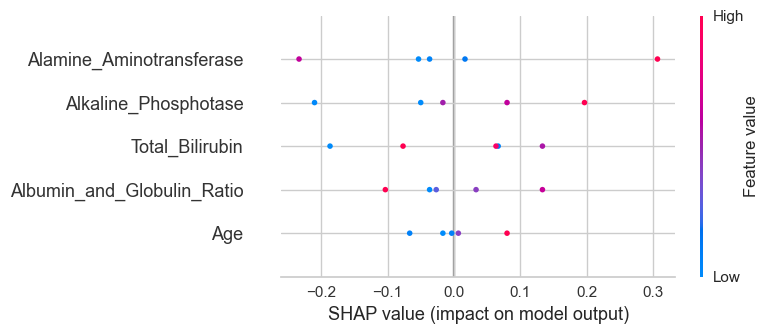

In [69]:
shap.summary_plot(shap_values,X_test_shape)

<Figure size 2000x1000 with 0 Axes>

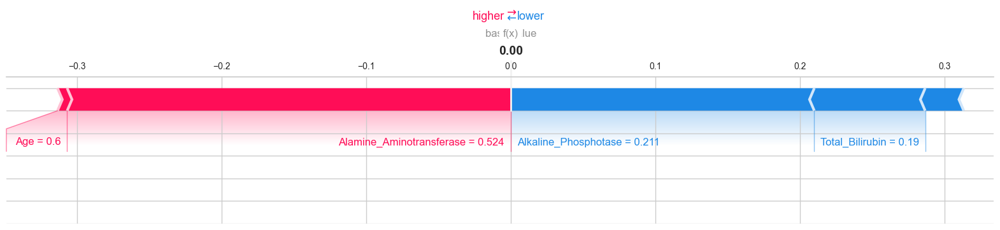

<Figure size 800x1000 with 0 Axes>

In [70]:
shap.initjs()
num_test = 2
fig = plt.figure(figsize=(20,10))
shap.force_plot(explainer.expected_value, shap_values[num_test,:], X_test_scaled[num_test,:].round(3), feature_names=X.columns, matplotlib=True, show=True)
plt.savefig('force_plot.png')

# DEEP LEARNING RESEAU DE NEURONNE


In [71]:
QTscaler = QuantileTransformer()

In [72]:
X = df_foie_reajuste[['Age','Total_Bilirubin','Alkaline_Phosphotase', 'Alamine_Aminotransferase','Albumin_and_Globulin_Ratio']]
y = df_foie_reajuste['Dataset']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.75)


In [73]:
X_train_scaled = QTscaler.fit_transform(X_train)
X_test_scaled = QTscaler.transform(X_test)

In [74]:
print(X_train_scaled.shape)

(609, 5)


## Keras

In [75]:
modelK = Sequential()

In [76]:
#modelMLP.add(Dense(64, input_dim=X_train_scaled.shape[1], activation='relu'))
#modelMLP.add(Dense(32, activation='relu'))
#modelMLP.add(Dense(1, activation='sigmoid'))

In [77]:
modelK.add(Dense(64,activation='relu'))
modelK.add(Dropout(0.2))

modelK.add(Dense(32,activation='relu'))
modelK.add(Dropout(0.2))

modelK.add(Dense(16,activation='relu'))

modelK.add(Dense(1,activation='sigmoid'))

In [78]:
modelK.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy','Recall'])
#modelMLP.compile(optimizer=Adam(), loss='binary_crossentropy')


In [79]:
#early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=9)

In [80]:
modelK.fit(X_train_scaled, y_train, epochs=40, validation_data=[X_test_scaled, y_test], validation_split=0.2)


Epoch 1/40
20/20 [==============================] - 2s 21ms/step - loss: 0.6867 - accuracy: 0.5140 - recall: 0.9904 - val_loss: 0.6851 - val_accuracy: 0.4581 - val_recall: 1.0000
Epoch 2/40
20/20 [==============================] - 0s 5ms/step - loss: 0.6761 - accuracy: 0.5140 - recall: 0.9744 - val_loss: 0.6792 - val_accuracy: 0.4778 - val_recall: 0.9892
Epoch 3/40
20/20 [==============================] - 0s 7ms/step - loss: 0.6604 - accuracy: 0.5550 - recall: 0.8978 - val_loss: 0.6678 - val_accuracy: 0.5567 - val_recall: 0.8280
Epoch 4/40
20/20 [==============================] - 0s 5ms/step - loss: 0.6434 - accuracy: 0.6190 - recall: 0.8946 - val_loss: 0.6589 - val_accuracy: 0.5567 - val_recall: 0.7957
Epoch 5/40
20/20 [==============================] - 0s 6ms/step - loss: 0.6336 - accuracy: 0.6322 - recall: 0.7700 - val_loss: 0.6415 - val_accuracy: 0.6552 - val_recall: 0.6989
Epoch 6/40
20/20 [==============================] - 0s 6ms/step - loss: 0.6206 - accuracy: 0.6371 - recall: 0

In [81]:
loss, accuracy ,recall = modelK.evaluate(X_test_scaled, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Test Recall: {recall:.4f}")

7/7 [==============================] - 0s 2ms/step - loss: 0.6241 - accuracy: 0.6798 - recall: 0.5161
Test Loss: 0.6241
Test Accuracy: 0.6798
Test Recall: 0.5161


## MLP via skleanr + optim hyperparametres


In [82]:
param_grid = {
    'hidden_layer_sizes': [(64,), (128,), (256,)],
    'activation': ['relu', 'tanh', 'sigmoid'],
    'learning_rate_init': [0.001, 0.01, 0.1]
}

In [83]:
mlp_model = MLPClassifier(max_iter=1000)

In [84]:
def custom_scorer(y_true, y_pred):
    recall = recall_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    # Poids arbitraire pour favoriser le recall
    return 0.8 * recall + 0.2 * accuracy

In [85]:
grid_search = GridSearchCV(mlp_model, param_grid, cv=3, scoring='recall', verbose=1)
grid_search.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


GridSearchCV(cv=3, error_score=nan,
             estimator=MLPClassifier(activation='relu', alpha=0.0001,
                                     batch_size='auto', beta_1=0.9,
                                     beta_2=0.999, early_stopping=False,
                                     epsilon=1e-08, hidden_layer_sizes=(100,),
                                     learning_rate='constant',
                                     learning_rate_init=0.001, max_fun=15000,
                                     max_iter=1000, momentum=0.9,
                                     n_iter_no_change=10,
                                     nesterovs_momentum=True, power_t=0.5,
                                     random_state=None, shuffle=True,
                                     solver='adam', tol=0.0001,
                                     validation_fraction=0.1, verbose=False,
                                     warm_start=False),
             n_jobs=None,
             param_grid={'activation': ['relu', 'tanh', 'sigmoid'],
                         'hidden_layer_sizes': [(64,), (128,), (256,)],
                         'learning_rate_init': [0.001, 0.01, 0.1]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='recall', verbose=1)

In [86]:
print("Meilleurs hyperparamètres:", grid_search.best_params_)


Meilleurs hyperparamètres: {'activation': 'tanh', 'hidden_layer_sizes': (128,), 'learning_rate_init': 0.1}


In [87]:
final_model = grid_search.best_estimator_

In [88]:
y_pred = final_model.predict(X_test_scaled)


In [89]:
final_recall = recall_score(y_test, y_pred)
final_accuracy = accuracy_score(y_test, y_pred)

print("Recall sur l'ensemble de test:", final_recall)
print("Accuracy sur l'ensemble de test:", final_accuracy)

Recall sur l'ensemble de test: 0.5483870967741935
Accuracy sur l'ensemble de test: 0.6896551724137931
